In [1]:
# common stuff
from __future__ import (absolute_import, division,
                        print_function, unicode_literals)
import warnings
warnings.simplefilter('ignore')
%pylab inline
%config InlineBackend.figure_format = 'png' 
from pylab import rcParams
rcParams['figure.figsize'] = 8,5
import numpy as np
import pandas as pd

Populating the interactive namespace from numpy and matplotlib


In [2]:
df = pd.read_excel('geo_comment.xlsx')
print(df.shape)
display(df.head(10))
display(df.info())
# no NaNs, good

(70382, 5)


,x,y,comment_class,multiplier,comment
0,37.612416,55.777454,-1,1,Во все разделы правил землепользования и застр...
1,37.612416,55.777454,-1,1,На основании вступившего в законную силу судеб...
2,37.603298,55.742108,-1,1,Внести в Проект правил землепользования и заст...
3,37.558526,55.728758,-1,1,Учитывая социальную значимость проекта строите...
4,37.566431,55.731794,-1,1,Учитывая социальную значимость проекта строите...
5,37.558526,55.728758,-1,1,Установить зону развития по адресу: Новодевичи...
6,37.566431,55.731794,-1,1,Установить зону развития по адресу: Новодевичи...
7,37.558957,55.723399,-1,1,Прошу поменять зону сохранения нахождения объе...
8,37.558957,55.723399,-1,1,Прошу перевести из зоны сохранения в зону разв...
9,37.565767,55.734567,-1,1,Прошу внести технико-экономические показатели ...


<class 'pandas.core.frame.DataFrame'>
Int64Index: 70382 entries, 0 to 70381
Data columns (total 5 columns):
x                70382 non-null float64
y                70382 non-null float64
comment_class    70382 non-null int64
multiplier       70382 non-null int64
comment          70382 non-null object
dtypes: float64(2), int64(2), object(1)
memory usage: 3.2+ MB


None

In [3]:
display(df["comment_class"].value_counts())
display(df["multiplier"].value_counts().sort(inplace=False, ascending=False).head(10))
# most are 1-person votes, mostly "against" votes

-1    58552
 1    11830
Name: comment_class, dtype: int64

1      69934
29        38
28        27
11        25
23        24
4         23
42        21
109       21
3         15
15        14
Name: multiplier, dtype: int64

In [4]:
# x,y are longitude and latitude, fix naming in order to avoid confusion
df["lon"] = df["x"]
df["lat"] = df["y"]
df.drop(["x", "y"], axis=1, inplace=True)
df.head()

,comment_class,multiplier,comment,lon,lat
0,-1,1,Во все разделы правил землепользования и застр...,37.612416,55.777454
1,-1,1,На основании вступившего в законную силу судеб...,37.612416,55.777454
2,-1,1,Внести в Проект правил землепользования и заст...,37.603298,55.742108
3,-1,1,Учитывая социальную значимость проекта строите...,37.558526,55.728758
4,-1,1,Учитывая социальную значимость проекта строите...,37.566431,55.731794


In [5]:
# Let's expand votes, repeat each row 'multiplier' times
idx = np.repeat(df.index.ravel(), df["multiplier"].ravel())
df = df.loc[idx]
print(df.shape)

(108806, 5)


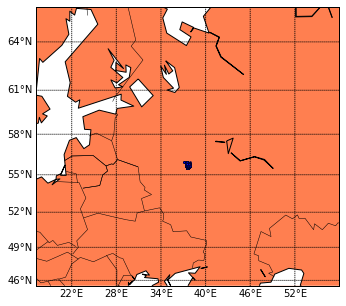

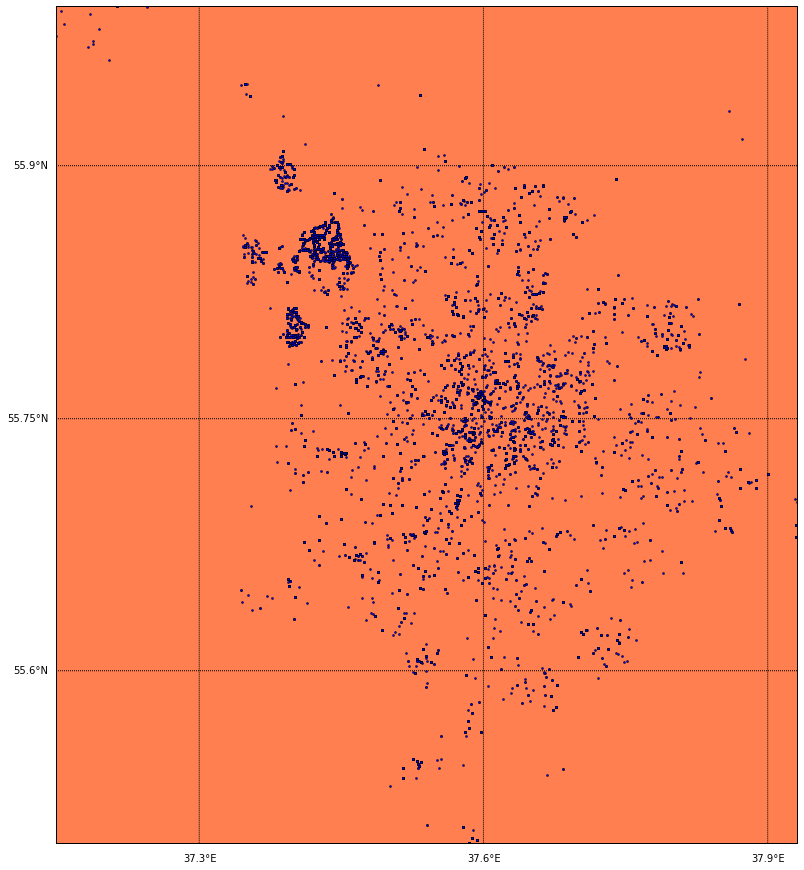

In [6]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import seaborn as sns

def draw_map(df, extra, grid_step):
    m = Basemap(
        projection='merc',
        llcrnrlon=df["lon"].min() - extra[1], llcrnrlat=df["lat"].min() - extra[0],
        urcrnrlon=df["lon"].max() + extra[1], urcrnrlat=df["lat"].max() + extra[0])    
    m.drawcoastlines()
    m.drawcountries()
    m.fillcontinents(color = 'coral')
    m.drawmapboundary()
    m.drawparallels(np.arange(10.0, 70.0, grid_step), labels = [1,0,0,0])
    m.drawmeridians(np.arange(10.0, 70.0, grid_step*2), labels = [0,0,0,1])    
    x,y = m(df["lon"].ravel(), df["lat"].ravel())
    m.plot(x, y, 'bo', markersize=2)
    plt.show()
    
# let's draw it on a large-scale map
draw_map(df, (10, 20), 3)
# yepp, this does look like Moscow :)
# let's make a close-up
rcParams['figure.figsize'] = 15,15
draw_map(df, (0, 0), 0.15)
rcParams['figure.figsize'] = 8,5

In [7]:
#ok, better, but still... I want to see Moscow districts and stuff here. Let's do this!
import geotiler

mm = geotiler.Map(extent=(float(df["lon"].min()), float(df["lat"].min()),
    float(df["lon"].max()), float(df["lat"].max())), zoom=10)

moscow_img = geotiler.render_map(mm)

configuration file /home/stas/.config/geotiler/geotiler.ini does not exist


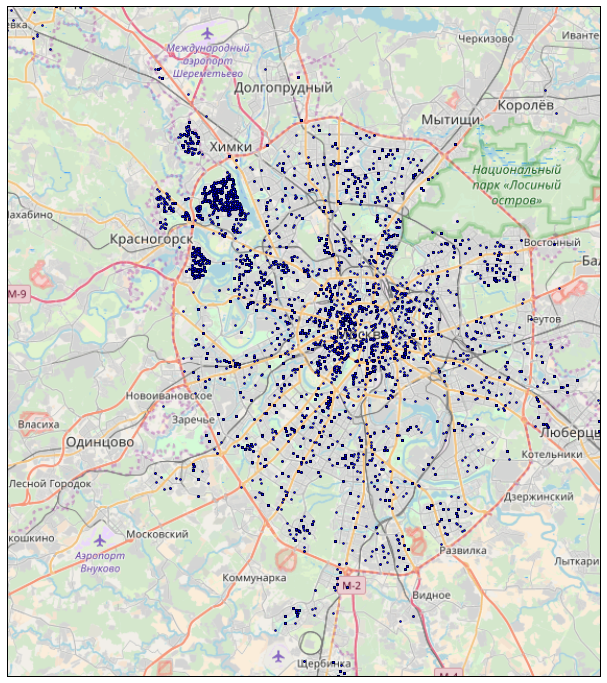

In [8]:
plt.figure(figsize=(12, 12))

m = Basemap(
    projection='merc',
    llcrnrlon=df["lon"].min(), llcrnrlat=df["lat"].min(),
    urcrnrlon=df["lon"].max(), urcrnrlat=df["lat"].max())

m.imshow(moscow_img, origin='upper')

x,y = m(df["lon"].ravel(), df["lat"].ravel())
m.plot(x, y, 'bo', markersize=2)

plt.show()
# Niiice, much better
# I can already see that there're ~5 clusters, i.e.: Golovinsky, Strogino, Kurkino, Mitino
# and Moscow center (though it's pretty messy), there're also a number of really small clusters
# like Vostochnoe Butovo, etc.

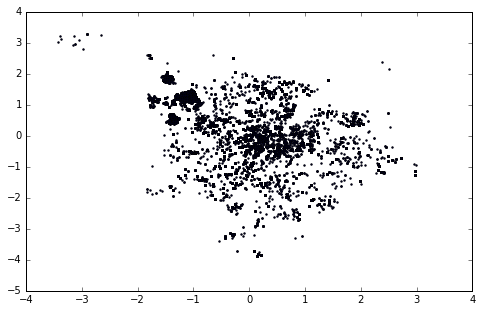

In [9]:
# Let's make a clustering
X = df[["lon", "lat"]]

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# Scaler stuff
X_scaled = scaler.fit_transform(X)

# Let's see how it looks like
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], s=2)
# Looks fine

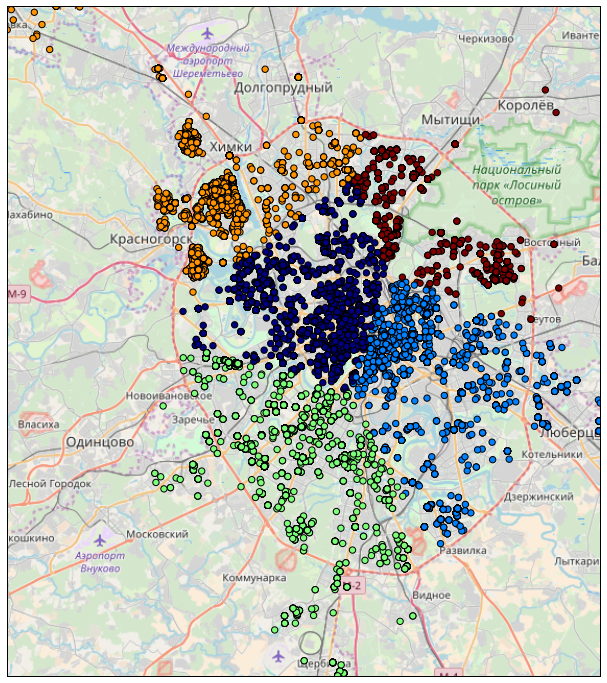

In [10]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

def draw_clusters(df, Y, noise = False):
    plt.figure(figsize=(12, 12))
    m = Basemap(
        projection='merc',
        llcrnrlon=df["lon"].min(), llcrnrlat=df["lat"].min(),
        urcrnrlon=df["lon"].max(), urcrnrlat=df["lat"].max())
    m.imshow(moscow_img, origin='upper')
    x,y = m(df["lon"].ravel(), df["lat"].ravel())
    if noise:
        m.scatter(x[Y < 0], y[Y < 0], c=Y[Y < 0], s=40)        
    else:
        m.scatter(x[Y >= 0], y[Y >= 0], c=Y[Y >= 0], s=40)        
    plt.show()
    
# Let's just try k-means first with 5 clusters
# kmeans will use euclidean distance, for lat/lon it's
# better to use haversine distance, but let's just ignore that
# for now
    
clf = KMeans(n_clusters=5)
Y = clf.fit_predict(X_scaled)
draw_clusters(df, Y)

# Meh.
# Well, it's k-means

Num clusters = 20


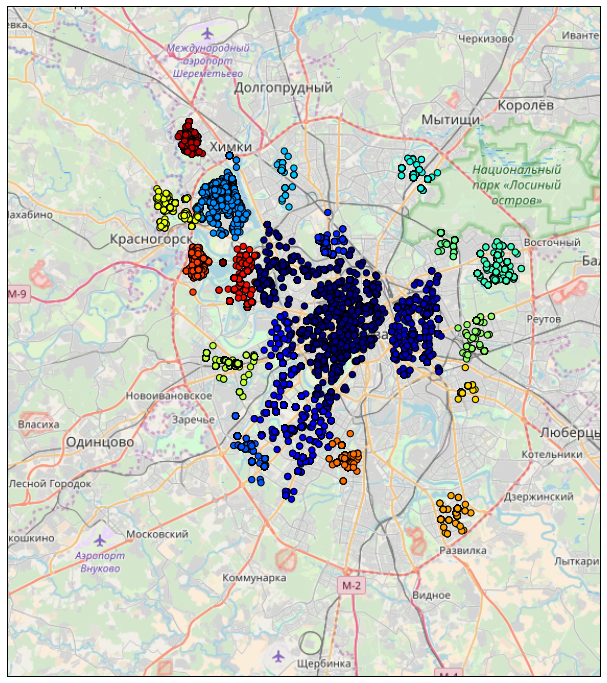

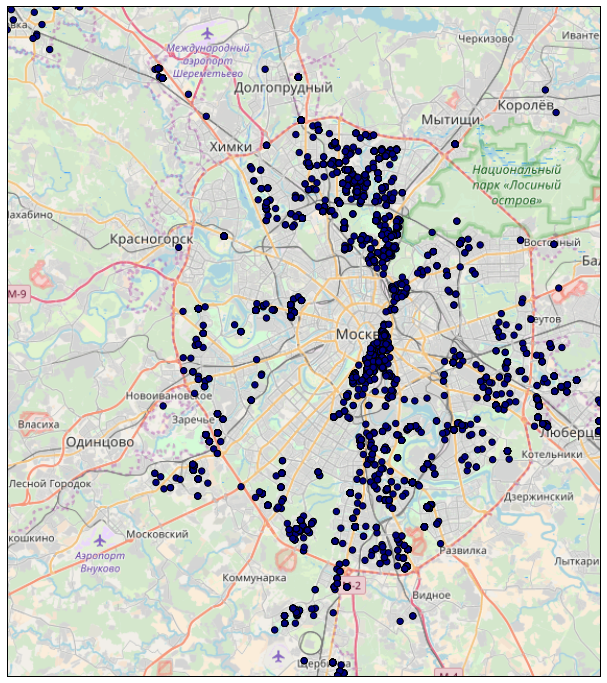

In [11]:
from sklearn.cluster import DBSCAN

# Let's try DBSCAN, DBSCAN allows us to use haversine, let's take advantage of that :)
# Since it's haversine on original data we can specify meaningful epsilon,
# let's take 1.5km, let's also take 500 as num samples, i.e. we specify
# that all votes within 1.5km range and with at least 500 neighbours are considered
# as one cluster

kms_per_radian = 6371.0088

clf = DBSCAN(eps=1.5 / kms_per_radian, min_samples=500, algorithm='ball_tree', metric='haversine')
Y = clf.fit_predict(np.radians(X))
print("Num clusters = %d" % len(set(Y[Y >= 0])))
# And plot clusters separately
draw_clusters(df, Y, False)
# From noise
draw_clusters(df, Y, True)
# Well, DBSCAN is definitely better than k-means, we can see
# Golovinsky, Strogino, Kurkino and Mitino clusters as well as many others
# which we didn't notice earlier because of the high density, now we can see
# that there're ~20 clusters

# As for the "noise", well, we may increase num_samples and eps and some of that
# will go to clusters, it all depends on the problem...

-1    95147
 1    13659
Name: comment_class, dtype: int64

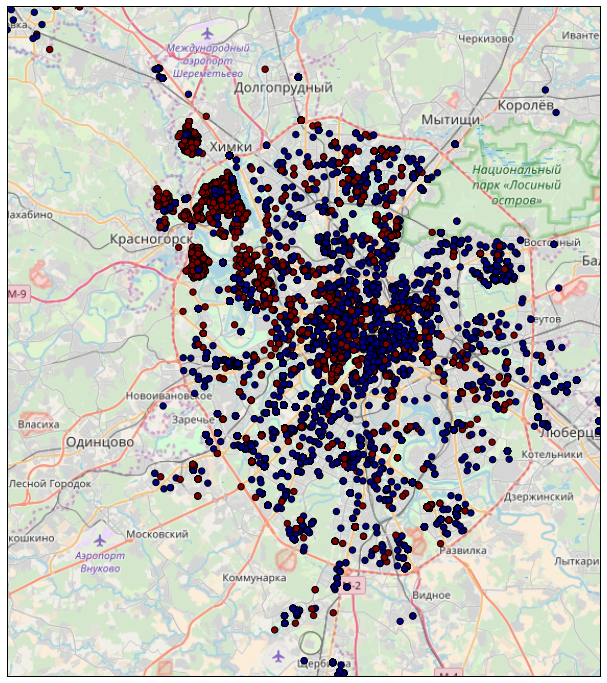

In [12]:
# Let's look at "yes"/"no" votes, we'll use DBSCAN from now on since k-means is pretty useless
# and DBSCAN looks like the right tool for geodata clustering (we could try other clustering algorithms,
# but seriously, DBSCAN hyperparams make sense and it's just what we need here)

# Let's look at total "yes" and "no" votes ("yes" votes are red)
display(df["comment_class"].value_counts())
Y = np.ones(len(df))
Y[(df["comment_class"] == -1).ravel()] = 0
draw_clusters(df, Y)
# So, looks like Moscow center is mostly "no" votes and they're majority,
# more distant districts are mostly "yes" votes and they're minority

Yes clusters = 4


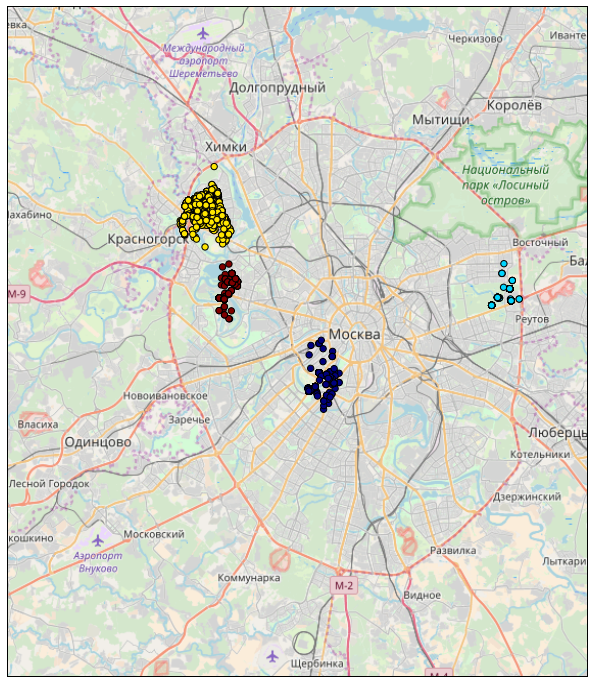

No clusters = 22


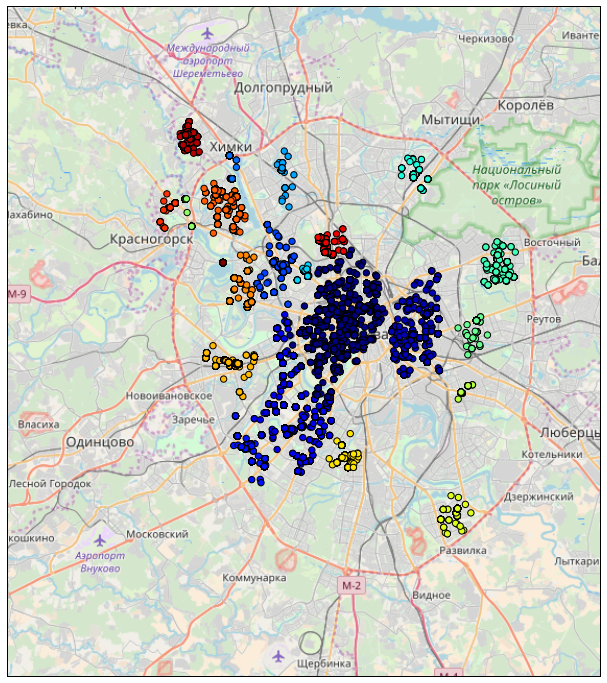

In [13]:
# Clusters

Xyes = X[df["comment_class"] == 1]
Xno = X[df["comment_class"] == -1]

clf = DBSCAN(eps=1.5 / kms_per_radian, min_samples=500, algorithm='ball_tree', metric='haversine')
Y = clf.fit_predict(np.radians(Xyes))
print("Yes clusters = %d" % len(set(Y[Y >= 0])))
draw_clusters(Xyes, Y, False)

clf = DBSCAN(eps=1.5 / kms_per_radian, min_samples=500, algorithm='ball_tree', metric='haversine')
Y = clf.fit_predict(np.radians(Xno))
print("No clusters = %d" % len(set(Y[Y >= 0])))
draw_clusters(Xno, Y, False)

Optimal K is: 3


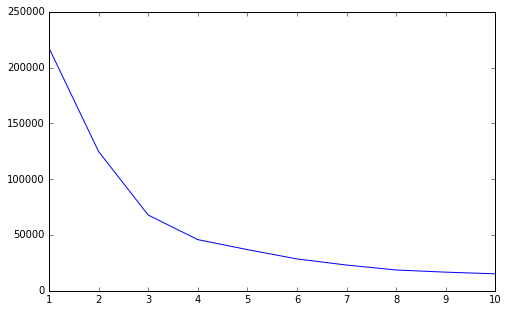

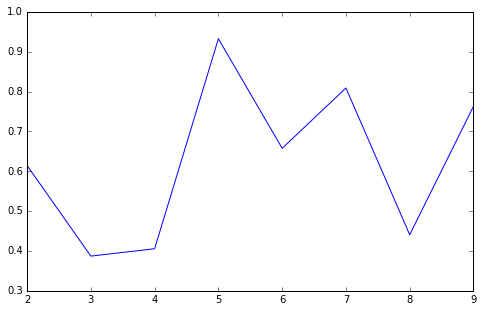

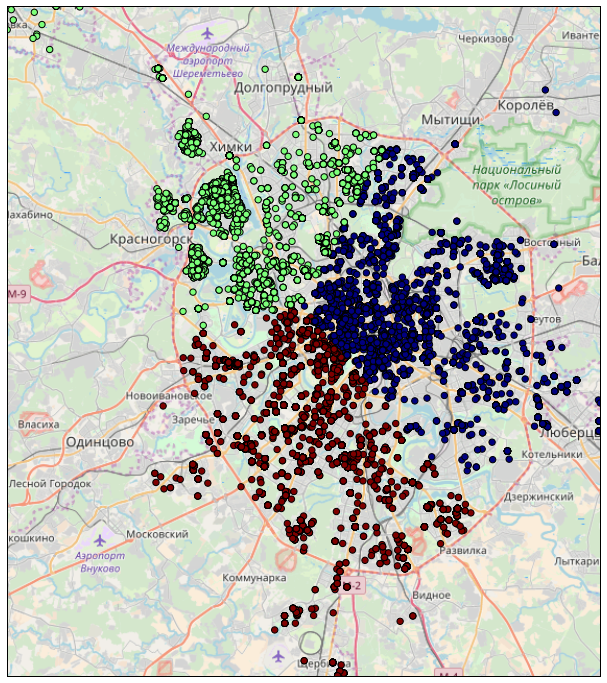

In [14]:
# Now we want to use k-means and find optimal number of clusters

k_inertia = []
ks = range(1,11)

for k in ks:
    clf_kmeans = KMeans(n_clusters=k)
    clusters_kmeans = clf_kmeans.fit_predict(X_scaled, )
    k_inertia.append(clf_kmeans.inertia_)
plt.plot(ks, k_inertia)
diff = np.diff(k_inertia)
diff_r = diff[1:] / diff[:-1]
plt.figure()
plt.plot(ks[1:-1], diff_r)
k_opt = ks[np.argmin(diff_r)+1]
print("Optimal K is: %d" % k_opt)

# Optimal is 3

clf = KMeans(n_clusters=k_opt)
Y = clf.fit_predict(X_scaled)
draw_clusters(df, Y)

Num clusters = 9


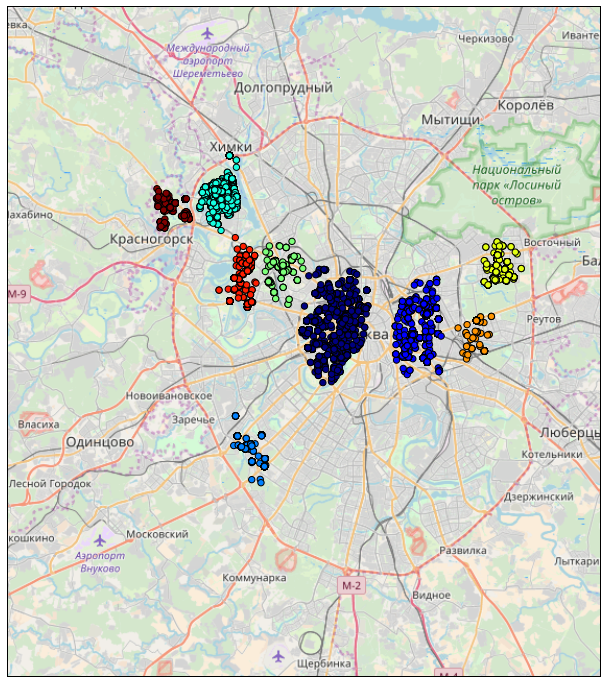

In [15]:
### LVL2 (1) ###
# Let's find districts that actively voted, basically it's DBSCAN that we used
# before, but let's tune parameters a bit

clf = DBSCAN(eps=1.5 / kms_per_radian, min_samples=2000, algorithm='ball_tree', metric='haversine')
Y = clf.fit_predict(np.radians(X))
print("Num clusters = %d" % len(set(Y[Y >= 0])))
draw_clusters(df, Y, False)

# Looks like what we needed

In [19]:
### LVL2 (2) ###
# Now, let's cluster against discussion topics
# Achtung! This piece takes A LOT of time!

import nltk
import string

nltk.download('punkt')
nltk.download('snowball_data')
nltk.download('stopwords')

# It's way too long because of nltk and also it's linear, no way
# to specify n_jobs and stuff, I'll just use a subset of df, sry :)
X = df["comment"].head(10000)

X = X.str.lower()
X = X.str.translate(dict.fromkeys(map(ord, string.punctuation)))

from nltk.stem.snowball import RussianStemmer
from nltk.corpus import stopwords

stemmer = RussianStemmer()

def stem_tokens(tokens, stemmer):
    stemmed = []
    for item in tokens:
        stemmed.append(stemmer.stem(item))
    return stemmed

def tokenize(text):
    tokens = nltk.word_tokenize(text)
    stems = stem_tokens(tokens, stemmer)
    return stems

from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vec = TfidfVectorizer(tokenizer=tokenize, stop_words=stopwords.words("russian"), max_features=1000)
Xt = tfidf_vec.fit_transform(X)

[nltk_data] Downloading package punkt to /home/stas/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package snowball_data to
[nltk_data]     /home/stas/nltk_data...
[nltk_data]   Package snowball_data is already up-to-date!
[nltk_data] Downloading package stopwords to /home/stas/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


0.33873145894609591

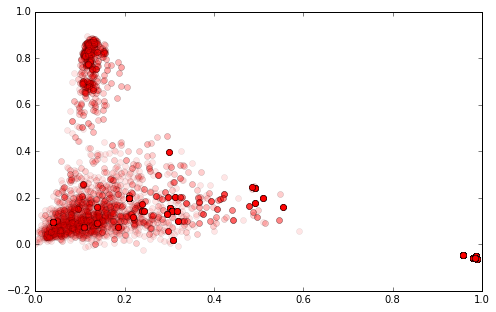

In [20]:
# Let's reduce dimensions and visualize using SVD

from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(n_components=2)
Xt2 = svd.fit_transform(Xt)
plt.plot(Xt2[:,0], Xt2[:,1], 'ro', alpha=0.1)
display(svd.explained_variance_ratio_.sum())
# Looks like 3 clusters, ratio is 33%, let's give it a try

Cluster 0: проект дом район москв пзз № участк строительств ул территор
Cluster 1: « » пзз гпзу слушан публичн существ положен зон градостроительн
Cluster 2: квм площад развит предельн центр га 25000 владен наземн медицинск


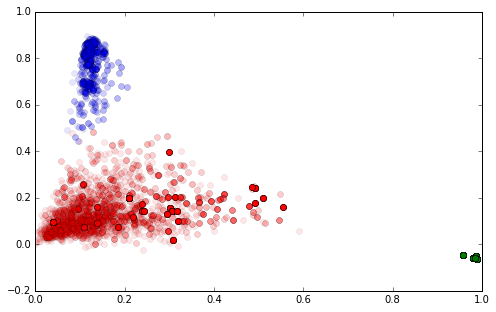

In [21]:
K=3

clf = KMeans(n_clusters=K)
# Output of TfidfVectorizer is already normalized, we can use it as-is
Y = clf.fit_predict(Xt)

for i,color in zip(range(3), {'blue','red','green'}):
    t = Xt2[Y==i]
    plt.plot(t[:,0], t[:,1], 'ro', alpha=0.1, c=color)
    
order_centroids = clf.cluster_centers_.argsort()[:, ::-1]

# Let's print most common features in clusters
terms = tfidf_vec.get_feature_names()
for i in range(K):
    print("Cluster %d:" % i, end='')
    for ind in order_centroids[i, :10]:
        print(' %s' % terms[ind], end='')
    print()
    
# It's all basically about construction and stuff...
# Cluster 0: looks like house construction
# Cluster 1: looks like it's about construction zones
# Cluster 2: looks like it's about center expansion, also has something to do
# with medical construction